# Chapter 10 - Modern Recurrent Neural Networks

## 10.1. Long Short-Term Memory (LSTM)

The *long short-term memory* (LSTM) model resembles standard recurrent neural networks but each ordinary recurrent node is replaced by a *memory cell*. Each memory cell contains an *internal state*, i.e., a node with a self-connected recurrent edge of fixed weight 1, ensuring that the gradient can pass across many time steps without vanishing or exploding.

Simple recurrent neural networks have *long-term memory* in the form of weights. The weights change slowly during training, encoding general knowledge about the data. They also have *short-term memory* in the form of ephemeral activations, which pass from each node to successive nodes.

In [1]:
import torch
from torch import nn

from d2l import torch as d2l

### 10.1.1. Gated Memory Cell

Each memory cell is equipped with an *internal state* and a number of multiplicative gates that determine whether
1. a given input should impact the internal state (the *input gate*),
2. the internal state should be flushed to 0 (the *forget gate*), and
3. the internal state of a given neuraon should be allowed to impact the cell's output (the *output gate*).

#### 10.1.1.1. Gated Hidden State

The gating support of the hidden state distinguishes the LSTMs from the vanilla RNNs.

#### 10.1.1.2. Input Gate, Forget Gate, and Output Gate

![](../imgs/ch10/lstm-0.svg)

The figure above shows the data feeding into the LSTM gates are the input at the current time step and the hidden state of the previous time step. Three fully connected layers with sigmoid activation functions compute the values of the input, forget, and output gates. All values of the threee gates are in the range of (0, 1) due to sigmoid functions.

The *input node* is computed with a *tanh* activation function. 

The *input gate* determines how much of the input node's value should be added to the current memory cell internal state. The *forget gate* determines whether to keep the current value of the memory or flush it. The *output gate* determines whether the memory cell should influence the output at the current time step.

Suppose that there are $h$ hidden units, the batch size is $n$, and the number of inputs is $d$. Thus, the input is $\mathbf{X}_t \in \mathbb{R}^{n \times d}$ and the hidden state of the previous time step is $\mathbf{H}_{t-1} \in \mathbb{R}^{n \times h}$. 

Then, the gates at time step $t$ are defined as follows: the input gate is $\mathbf{I}_t \in \mathbb{R}^{n \times h}$, the forget gate is $\mathbf{F}_t \in \mathbb{R}^{n \times h}$, and the output gate is $\mathbf{O}_t \in \mathbb{R}^{n \times h}$:
\begin{split}\begin{aligned}
\mathbf{I}_t &= \sigma(\mathbf{X}_t \mathbf{W}_{\textrm{xi}} + \mathbf{H}_{t-1} \mathbf{W}_{\textrm{hi}} + \mathbf{b}_\textrm{i}),\\
\mathbf{F}_t &= \sigma(\mathbf{X}_t \mathbf{W}_{\textrm{xf}} + \mathbf{H}_{t-1} \mathbf{W}_{\textrm{hf}} + \mathbf{b}_\textrm{f}),\\
\mathbf{O}_t &= \sigma(\mathbf{X}_t \mathbf{W}_{\textrm{xo}} + \mathbf{H}_{t-1} \mathbf{W}_{\textrm{ho}} + \mathbf{b}_\textrm{o}),
\end{aligned}\end{split}
where $\mathbf{W}_{\textrm{xi}}, \mathbf{W}_{\textrm{xf}}, \mathbf{W}_{\textrm{xo}} \in \mathbb{R}^{d \times h}$ and $\mathbf{W}_{\textrm{hi}}, \mathbf{W}_{\textrm{hf}}, \mathbf{W}_{\textrm{ho}} \in \mathbb{R}^{h \times h}$ are weight parameters and $\mathbf{b}_\textrm{i}, \mathbf{b}_\textrm{f}, \mathbf{b}_\textrm{o} \in \mathbb{R}^{1 \times h}$ are bias parameters.

#### 10.1.1.3. Input Node

The *input node* $\tilde{\mathbf{C}}_t \in \mathbb{R}^{n \times h}$ is computed similarly to that of the three gates defined above, but uses a *tanh* function with a value range for (-1, 1), which leads to 
\begin{split}
\tilde{\mathbf{C}}_t = \textrm{tanh}(\mathbf{X}_t \mathbf{W}_{\textrm{xc}} + \mathbf{H}_{t-1} \mathbf{W}_{\textrm{hc}} + \mathbf{b}_\textrm{c})
\end{split}
where $\mathbf{W}_{\textrm{xc}} \in \mathbb{R}^{d \times h}$ and $\mathbf{W}_{\textrm{hc}} \in \mathbb{R}^{h \times h}$ are weight parameters and $\mathbf{b}_\textrm{c} \in \mathbb{R}^{1 \times h}$ is a bias parameter.

The figure below shows the computation of the input node.

![](../imgs/ch10/lstm-1.svg)

#### 10.1.1.4. Memory Cell Internal State

In LSTMs, the input gate $\mathbf{I}_t$ governs how much we take new data into account via $\tilde{\mathbf{C}}_t$, and the forget gate $\mathbf{F}_t$ addresses how much of the old cell internal state $\mathbf{C}_{t-1}\in \mathbb{R}^{n \times h}$ we retain:
\begin{split}
\mathbf{C}_t = \mathbf{F}_t \odot \mathbf{C}_{t-1} + \mathbf{I}_t \odot \tilde{\mathbf{C}}_t
\end{split}
where $\odot$ is the elementwise multiplication operator, as shown in the figure below.

![](../imgs/ch10/lstm-2.svg)

If the forget gate is always 1 and the input gate is walys 0, the memory cell internal state $\mathbf{C}_{t-1}$ will remain constant foever, passing unchanged to each subsequent time step.

Input gates and forget gates give the model the flexibility of being able to learn when to keep this value unchanged and when to perturb it in response to subsequent inputs. In practice, this alleviates the vanishing gradient problem, resulting in models that are much easier to train, especially when facing datasets with long sequence lengths.

#### 10.1.1.5. Hidden State

The output of the memory cell, i.e., the hidden state $\mathbf{H}_t \in \mathbb{R}^{n \times h}$, is computed using the output gate. We first apply `tanh` to the memory cell internal state and then apply another point-wise multiplication, this time with the output gate. This ensures that the values of $\mathbf{H}_t$ are always in the interval (-1, 1):
\begin{split}
\mathbf{H}_t = \mathbf{O}_t \odot \tanh(\mathbf{C}_t)
\end{split}
where it is demonstrated in the figure below.

![](../imgs/ch10/lstm-3.svg)

Whenever the output gate is close to 1, we allow the memory cell internal state to impact the subsequent layers uninhibited, whereas for output gate values close to 0, we prevent the current memory from impacting other layers of the network at the current time step.

A memory cell can accrue information across many time steps without impacting the rest of the network (as long as the output gate takes values close to 0), and then suddenly impact the network at a subsequent time step as soon as the output gate flips from values close to 0 to values close to 1.

### 10.1.2. Implementation from Scratch

#### 10.1.2.1. Initializing Model Parameters

In [3]:
class LSTMScratch(d2l.Module):
    '''LSTM from scratch'''
    def __init__(self, num_inputs, num_hiddens, sigma=0.01):
        super().__init__()
        self.save_hyperparameters()

        # initialize weights
        # with a Gaussian distribution with mean 0 and standard deviation sigma
        init_weight = lambda *shape: nn.Parameter(torch.randn(*shape) * sigma)
        triple = lambda: (
            init_weight(num_inputs, num_hiddens), # input weights
            init_weight(num_hiddens, num_hiddens), # hidden weights
            nn.Parameter(torch.zeros(num_hiddens)) # hidden bias to 0
        )

        # Input gate
        self.W_xi, self.W_hi, self.b_i = triple()
        # Forget gate
        self.W_xf, self.W_hf, self.b_f = triple()
        # Output gate
        self.W_xo, self.W_ho, self.b_o = triple()
        # Input node
        self.W_xc, self.W_hc, self.b_c = triple()

    def forward(self, inputs, H_C=None):
        # pass through 3 gates and 1 input node
        # Only the hidden state is passed to the output layer
        if H_C is None:
            # initial state with shape: (batch_size, num_hiddens)
            H = torch.zeros(
                (inputs.shape[1], self.num_hiddens), device=inputs.device
            )
            C = torch.zeros(
                (inputs.shape[1], self.num_hiddens), device=inputs.device
            )
        else:
            H, C = H_C

        outputs = []

        for X in inputs:
            I = torch.sigmoid(
                torch.matmul(X, self.W_xi) + torch.matmul(H, self.W_hi) + self.b_i
            )
            F = torch.sigmoid(
                torch.matmul(X, self.W_xf) + torch.matmul(H, self.W_hf) + self.b_f
            )
            O = torch.sigmoid(
                torch.matmul(X, self.W_xo) + torch.matmul(H, self.W_ho) + self.b_o
            )

            C_tilde = torch.tanh(
                torch.matmul(X, self.W_xc) + torch.matmul(H, self.W_hc) + self.b_c
            )

            C = F * C + I * C_tilde
            H = O * torch.tanh(C)
            outputs.append(H)

        return outputs, (H, C)

#### 10.1.2.2. Training and Prediction

In [4]:
# load Time Machine dataset
data = d2l.TimeMachine(batch_size=1024, num_steps=32)
# initialize model
lstm = LSTMScratch(num_inputs=len(data.vocab), num_hiddens=32)
# initialize RNN language model
model = d2l.RNNLMScratch(lstm, vocab_size=len(data.vocab), lr=4)
# create a trainer
trainer = d2l.Trainer(max_epochs=100, gradient_clip_val=1, num_gpus=1)

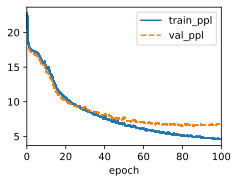

In [5]:
# train model
trainer.fit(model, data)

### 10.1.3. Concise Implementation

In [6]:
class LSTM(d2l.RNN):
    '''LSTM from PyTorch'''
    def __init__(self, num_inputs, num_hiddens):
        d2l.Module.__init__(self)
        self.save_hyperparameters()

        # initialize LSTM layer
        self.rnn = nn.LSTM(num_inputs, num_hiddens)

    def forward(self, inputs, H_C=None):
        return self.rnn(inputs, H_C)

In [ ]:
# initialize model
lstm = LSTM(num_inputs=len(data.vocab), num_hiddens=32)
# initialize RNN language model
model = d2l.RNNLM(lstm, vocab_size=len(data.vocab), lr=4)

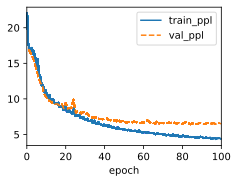

In [8]:
# train model
trainer.fit(model, data)

In [9]:
# predict next 20 characters
model.predict('it has',
              20,
              data.vocab,
              d2l.try_gpu()
              )

'it has and the time travel'

LSTMs are the prototypical latent variable autoregressive model with nontrivial state control. Many variants thereof have been proposed over the years, e.g., multiple layers, residual connections, different types of regularization. However, training LSTMs and other sequence models (such as GRUs) is quite costly because of the long range dependency of the sequence.

LSTMs have three types of gates: input gates, forget gates, and output gates that control the flow of information. The hidden layer output of LSTM includes the hidden state and the memory cell internal state. Only the hidden state is passed into the output layer while the memory cell internal state remains entirely internal. LSTMs can alleviate vanishing and exploding gradients.

## 10.2. Gated Recurrent Units (GRU)

The *gated recurrent unit* (GRU) offered a streamlined version of the LSTM memory cell that often achieves comparable performances but with the advantage of being faster to compute.

In [10]:
import torch
from torch import nn

from d2l import torch as d2l

### 10.2.1. Reset Gate and Update Gate

![](../imgs/ch10/gru-1.svg)

Unlike the LSTM memory cell, the GRU has two gates, a *reset gate* and an *update gate*. The reset gate controls how much of the previous state we may still want to remember, and the update gate would allow us to control how much of the new state is just a copy of the old one. The figure above illustrates the inputs for both the reset and update gates in a GRU, given the input of the current time step and the hidden state of the previous time step. The outputs of the gates are given by two fully connected layers with a sigmoid activation function.

For a given time step $t$, suppose that the input is a minibatch $\mathbf{X}_t \in \mathbb{R}^{n \times d}$ (number of examples = $n$; number of inputs = $d$) and the hidden state of the previous time step is $\mathbf{H}_{t-1} \in \mathbb{R}^{n \times h}$ (number of hidden units = $h$). Then, the reset gate $\mathbf{R}_t \in \mathbb{R}^{n \times h}$ and the update gate $\mathbf{Z}_t \in \mathbb{R}^{n \times h}$ are computed as follows:
\begin{split}\begin{aligned}
\mathbf{R}_t = \sigma(\mathbf{X}_t \mathbf{W}_{\textrm{xr}} + \mathbf{H}_{t-1} \mathbf{W}_{\textrm{hr}} + \mathbf{b}_\textrm{r}),\\
\mathbf{Z}_t = \sigma(\mathbf{X}_t \mathbf{W}_{\textrm{xz}} + \mathbf{H}_{t-1} \mathbf{W}_{\textrm{hz}} + \mathbf{b}_\textrm{z}),
\end{aligned}\end{split}
where $\mathbf{W}_{\textrm{xr}}, \mathbf{W}_{\textrm{xz}} \in \mathbb{R}^{d \times h}$ and $\mathbf{W}_{\textrm{hr}}, \mathbf{W}_{\textrm{hz}} \in \mathbb{R}^{h \times h}$ are weight parameters and $\mathbf{b}_\textrm{r}, \mathbf{b}_\textrm{z} \in \mathbb{R}^{1 \times h}$ are bias parameters.

### 10.2.2. Candidate Hidden State

Next, we integrate the reset gate $\mathbf{R}_t$ with the previous hidden state $\mathbf{H}_{t-1}$ to obtain the *candidate hidden state* $\tilde{\mathbf{H}}_t \in \mathbb{R}^{n \times h}$ at time step $t$:
\begin{split}
\tilde{\mathbf{H}}_t = \tanh(\mathbf{X}_t \mathbf{W}_{\textrm{xh}} + \left(\mathbf{R}_t \odot \mathbf{H}_{t-1}\right) \mathbf{W}_{\textrm{hh}} + \mathbf{b}_\textrm{h}),
\end{split}
where $\mathbf{W}_{\textrm{xh}} \in \mathbb{R}^{d \times h}$ and $\mathbf{W}_{\textrm{hh}} \in \mathbb{R}^{h \times h}$ are weight parameters and $\mathbf{b}_\textrm{h} \in \mathbb{R}^{1 \times h}$ is a bias parameter.

The figure below shows the computation of the candidate hidden state.

![](../imgs/ch10/gru-2.svg)

The result is a *candidate*, since we still need to incorporate the action of the update gate. The influence of the previous states can be reduced with the elementwise multiplication of $\mathbf{R}_t$ and $\mathbf{H}_{t-1}$. If the reset gate $\mathbf{R}_t$ is close to 1, the current state $\mathbf{X}_t$ and the previous state $\mathbf{H}_{t-1}$ are essentially combined to feed the candidate hidden state $\tilde{\mathbf{H}}_t$. If the reset gate $\mathbf{R}_t$ is close to 0, the previous hidden state $\mathbf{H}_{t-1}$ is ignored and the candidate hidden state $\tilde{\mathbf{H}}_t$ is determined solely by the current input $\mathbf{X}_t$.

### 10.2.3. Hidden State

The update gate $\mathbf{Z}_t$ determines the extent to which the new hidden state $\mathbf{H}_t \in \mathbb{R}^{n \times h}$ at the current time step $t$ matches the old state $\mathbf{H}_{t-1}$ compared with how much it resembles the new candidate state $\tilde{\mathbf{H}}_t$. 

The update gate $\mathbf{Z}_t$ can be used to blend the two states $\mathbf{H}_{t-1}$ and $\tilde{\mathbf{H}}_t$ to get the new hidden state $\mathbf{H}_t$:
\begin{split}
\mathbf{H}_t = \mathbf{Z}_t \odot \mathbf{H}_{t-1}  + (1 - \mathbf{Z}_t) \odot \tilde{\mathbf{H}}_t
\end{split}
where it is demonstrated in the figure below.

![](../imgs/ch10/gru-3.svg)

Whenever the update gate $\mathbf{Z}_t$ is close to 1, we simply retain the old state $\mathbf{H}_{t-1}$ without considering the candidate. In this case the information from $\mathbf{X}_t$ is ignored, effectively skipping time step $t$ in the dependency chain. Conversely, when $\mathbf{Z}_t$ is close to 0, the new state $\mathbf{H}_t$ approaches the candidate $\tilde{\mathbf{H}}_t$. 

In summary, GRUs have two gates
* Reset gates help capture short-term dependencies in sequences.
* Update gates help capture long-term dependencies in sequences.

### 10.2.4. Implementation from Scratch

#### 10.2.4.1. Initializing Model Parameters

We draw the weights from a Gaussian distribution with standard deviation to be `sigma` and set the bias to 0. The hyperparameter `num_hiddens` defines the number of hidden units. We instantiate all weights and biases relating to the update gate, the reset gate, and the candidate hidden state.

In [11]:
class GRUScratch(d2l.Module):
    def __init__(self, num_inputs, num_hiddens, sigma=0.01):
        super().__init__()
        self.save_hyperparameters()

        # initialize weights
        init_weight = lambda *shape: nn.Parameter(torch.randn(*shape) * sigma)
        triple = lambda: (
            init_weight(num_inputs, num_hiddens), # input weights
            init_weight(num_hiddens, num_hiddens), # hidden weights
            nn.Parameter(torch.zeros(num_hiddens)) # hidden bias to 0
        )
        
        # Update gate
        self.W_xz, self.W_hz, self.b_z = triple()
        # Reset gate
        self.W_xr, self.W_hr, self.b_r = triple()
        # Candidate hidden state
        self.W_xh, self.W_hh, self.b_h = triple()

    def forward(self, inputs, H=None):
        if H is None:
            # initial state with shape: (batch_size, num_hiddens)
            H = torch.zeros(
                (inputs.shape[1], self.num_hiddens), device=inputs.device
            )

        outputs = []
        for X in inputs:
            Z = torch.sigmoid(
                torch.matmul(X, self.W_xz) + torch.matmul(H, self.W_hz) + self.b_z
            )
            R = torch.sigmoid(
                torch.matmul(X, self.W_xr) + torch.matmul(H, self.W_hr) + self.b_r
            
            )

            H_tilde = torch.tanh(
                torch.matmul(X, self.W_xh) + torch.matmul(R * H, self.W_hh) + self.b_h
            )
            H = Z * H + (1 - Z) * H_tilde

            outputs.append(H)

        return outputs, H

### 10.2.4.2. Training

In [12]:
# load Time Machine dataset
data = d2l.TimeMachine(batch_size=1024, num_steps=32)
# initialize model
gru = GRUScratch(num_inputs=len(data.vocab), num_hiddens=32)
# initialize RNN language model
model = d2l.RNNLMScratch(gru, vocab_size=len(data.vocab), lr=4)
# create a trainer
trainer = d2l.Trainer(max_epochs=100, gradient_clip_val=1, num_gpus=1)

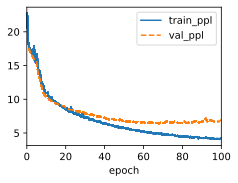

In [13]:
# train model
trainer.fit(model, data)

### 10.2.5. Concise Implementation

In [20]:
class GRU(d2l.RNN):
    def __init__(self, num_inputs, num_hiddens):
        d2l.Module.__init__(self)
        self.save_hyperparameters()

        # initialize GRU layer
        self.rnn = nn.GRU(num_inputs, num_hiddens)

In [22]:
# initialize model
gru = GRU(num_inputs=len(data.vocab), num_hiddens=32)
# initialize RNN language model
model = d2l.RNNLM(gru, vocab_size=len(data.vocab), lr=4)

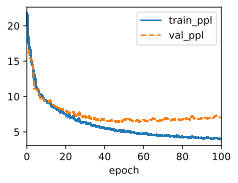

In [23]:
# train model
trainer.fit(model, data)

In [25]:
model.predict('it has',
              20,
              data.vocab,
              d2l.try_gpu()
)

'it has of the time travell'

Compared with LSTMs, GRUs achieve similar performance but tend to be lighter computationally. Generally, compared with simple RNNs, gated RNNS, just like LSTMs and GRUs, can better capture dependencies for sequences with large time step distances. GRUs contain basic RNNs as their extreme case whenever the reset gate is switched on. They can also skip subsequences by turning on the update gate.

## 10.3. Deep Recurrent Neural Networks

To build deep RNN, we simply stack the RNNs on top of each other. Given a sequence of length $T$, the first RNN produces a sequence of outputs, also of length $T$. These, in turn, constitute the inputs to the next RNN layer.

The figure below illustrates a deep RNN with $L$ hidden layers. Each hidden state operates on a sequential input and produces a sequential output. Any RNN cell (white box in the figure) at each time step depends on both the same layer's value at the previous time step and the previous layer's value at the same time step.

![](../imgs/ch10/deep-rnn.svg)

Suppose that we have a minibatch input $\mathbf{X}_t \in \mathbb{R}^{n \times d}$ (number of examples = $n$; number of inputs in each example = $d$) at time step $t$. At the same time step, let the hidden state of the $l$-th hidden layer ($l=1,\ldots,L$) be $\mathbf{H}_t^{(l)} \in \mathbb{R}^{n \times h}$ (number of hidden units = $h$) and the output layer variable be $\mathbf{O}_t \in \mathbb{R}^{n \times q}$ (number of outputs = $q$). Then, the hidden state of the $l$-th hidden layer at time step $t$ that uses the activation function $\phi_l$ is computed as follows:
\begin{split}
\mathbf{H}_t^{(l)} = \phi_l(\mathbf{H}_t^{(l-1)} \mathbf{W}_{\textrm{xh}}^{(l)} + \mathbf{H}_{t-1}^{(l)} \mathbf{W}_{\textrm{hh}}^{(l)}  + \mathbf{b}_\textrm{h}^{(l)})
\end{split}
where the weights $\mathbf{W}_{\textrm{xh}}^{(l)} \in \mathbb{R}^{h \times h}$ and $\mathbf{W}_{\textrm{hh}}^{(l)} \in \mathbb{R}^{h \times h}$, together with the bias $\mathbf{b}_\textrm{h}^{(l)} \in \mathbb{R}^{1 \times h}$, are the model parameters of the $l$-th hidden layer.

Finally, the calculation of the output layer is only based on the hidden state of the final $L$-th hidden layer:
\begin{split}
\mathbf{O}_t = \mathbf{H}_t^{(L)} \mathbf{W}_{\textrm{hq}} + \mathbf{b}_\textrm{q}
\end{split}
where the weight $\mathbf{W}_{\textrm{hq}} \in \mathbb{R}^{h \times q}$ and the bias $\mathbf{b}_\textrm{q} \in \mathbb{R}^{1 \times q}$ are the model parameters of the output layer.

Just as with MLPs, the number of hidden layers $L$ and the number of hidden units $h$ are hyperparameters that we can tune.

Common RNN layer widths ($h$) are in range (64, 2056), and common depths ($L$) are in the range (1, 8).

In [26]:
import torch
from torch import nn

from d2l import torch as d2l

### 10.3.1. Implementation from Scratch

In [32]:
# to implement a multilayer RNN, we can treat each layer as an RNNScratch instance
# with its own learnable parameters
class StackedRNNScratch(d2l.Module):
    def __init__(self, num_inputs, num_hiddens, num_layers, sigma=0.01):
        '''Stacked RNN from scratch
        
        Parameters
        ----------
        num_inputs : int
            number of inputs
        num_hiddens : int
            number of hidden units
        num_layers : int
            number of layers in the RNN
        sigma : float
            standard deviation of the Gaussian distribution to draw initial
            parameter values from (default 0.01)
        '''
        super().__init__()
        self.save_hyperparameters()

        # stack RNNScratch instances
        self.rnns = nn.Sequential(
            *[d2l.RNNScratch(
                num_inputs if i == 0 else num_hiddens,
                num_hiddens,
                sigma
            ) for i in range(num_layers)
            ]
        )

    def forward(self, inputs, Hs=None):
        outputs = inputs

        if Hs is None:
            Hs = [None] * self.num_layers

        for i in range(self.num_layers):
            outputs, Hs[i] = self.rnns[i](outputs, Hs[i])
            outputs = torch.stack(outputs, dim=0)

        return outputs, Hs

In [33]:
# load Time Machine dataset
data = d2l.TimeMachine(batch_size=1024, num_steps=32)
# initialize model
rnn_block = StackedRNNScratch(num_inputs=len(data.vocab),
                              num_hiddens=32,
                              num_layers=2) # 2 RNN layers
# initialize RNN language model
model = d2l.RNNLMScratch(rnn_block,
                         vocab_size=len(data.vocab),
                         lr=2)
# create a trainer
trainer = d2l.Trainer(max_epochs=100, gradient_clip_val=1, num_gpus=1)

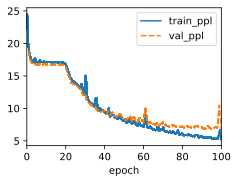

In [34]:
# train model
trainer.fit(model, data)

### 10.3.2. Concise Implementation

In [35]:
class GRU(d2l.RNN):
    '''Stacked GRU from PyTorch'''
    def __init__(self, num_inputs, num_hiddens, num_layers, dropout=0):
        d2l.Module.__init__(self)
        self.save_hyperparameters()

        self.rnn = nn.GRU(num_inputs, num_hiddens, num_layers, dropout=dropout)

The only thing we need to select is a nontrivial number of hidden layers specifying the value of `num_layers`:

In [37]:
gru = GRU(num_inputs=len(data.vocab),
          num_hiddens=32,
          num_layers=2) # 2 RNN layers
# initialize RNN language model
model = d2l.RNNLM(gru,
                  vocab_size=len(data.vocab),
                  lr=2)

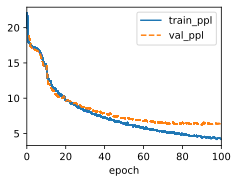

In [38]:
# train model
trainer.fit(model, data)

In [39]:
model.predict('it has',
              20,
              data.vocab,
              d2l.try_gpu()
)

'it has savill so a consion'

In deep RNNs, the hidden state information is passed to the next time step of the current layer and the current time step of the next layer.

## 10.4. Bidirectional Recurrent Neural Networks

So far, the working example of a sequence learning task has been language modeling, where we aim to predict the next token given all previous tokens in a sequence. In this case, the order of the sequence is essential to the prediction. However, there are many sequence learning tasks where it is perfectly fine to condition the prediction at every time step on **both the leftward and the rightward context**.

Another common task -- often useful as a pretraining exercise prior to fine-tuning a model on an actual task of interest -- is to mask out random tokens in a text document and then to train a sequence model to predict the values of the missing tokens:
* I am ___.
* I am ___ hungry.
* I am ___ hungry, and I can eat half of pig.

In this case, the order of the sequence is not essential to the prediction. The missing word can be any word in the vocabulary. We can achieve this by transforming any unidirectional RNN into a bidirectional RNN.

![](../imgs/ch10/birnn.svg)

The figure above shows how we can implement two unidirectional RNN layers chained together in opposite directions and acting on the same input. For the first RNN layer, the first input is $\mathbf{x}_1$ and the last input is $\mathbf{x}_T$, but for the second RNN layer, the first input is $\mathbf{x}_T$ and the last input is $\mathbf{x}_1$. TO produce the output of this bidirectional RNN layer, we simply concatenate together the corresponding outputs of the two underlying unidirectional RNN layers.

Mathematically, for any time step $t$, we consider a minibatch input $\mathbf{X}_t \in \mathbb{R}^{n \times d}$ (number of examples = $n$; number of inputs in each example = $d$), and let the hidden layer activation function be $\phi$. In the bidirectional architecture, the forward and backward hidden states from this time step are $\overrightarrow{\mathbf{H}}_t \in \mathbb{R}^{n \times h}$ and $\overleftarrow{\mathbf{H}}_t \in \mathbb{R}^{n \times h}$, respectively, where $h$ is the number of hidden units.

The forward and backward hidden state updates are given by
\begin{split}\begin{aligned}
\overrightarrow{\mathbf{H}}_t &= \phi(\mathbf{X}_t \mathbf{W}_{\textrm{xh}}^{(f)} + \overrightarrow{\mathbf{H}}_{t-1} \mathbf{W}_{\textrm{hh}}^{(f)}  + \mathbf{b}_\textrm{h}^{(f)}),\\
\overleftarrow{\mathbf{H}}_t &= \phi(\mathbf{X}_t \mathbf{W}_{\textrm{xh}}^{(b)} + \overleftarrow{\mathbf{H}}_{t+1} \mathbf{W}_{\textrm{hh}}^{(b)}  + \mathbf{b}_\textrm{h}^{(b)}),
\end{aligned}\end{split}
where the weights $\mathbf{W}_{\textrm{xh}}^{(f)} \in \mathbb{R}^{d \times h}$, $\mathbf{W}_{\textrm{hh}}^{(f)} \in \mathbb{R}^{h \times h}$, $\mathbf{W}_{\textrm{xh}}^{(b)} \in \mathbb{R}^{d \times h}$, and $\mathbf{W}_{\textrm{hh}}^{(b)} \in \mathbb{R}^{h \times h}$, and the biases $\mathbf{b}_\textrm{h}^{(f)} \in \mathbb{R}^{1 \times h}$ and $\mathbf{b}_\textrm{h}^{(b)} \in \mathbb{R}^{1 \times h}$ are all the model parameters.

Next, we concatenate the forward and backward hidden states $\overrightarrow{\mathbf{H}}_t$ and $\overleftarrow{\mathbf{H}}_t$ to obtain the hidden state $\mathbf{H}_t \in \mathbb{R}^{n \times 2h}$ for feeding into the output layer. In deep bidirectional RNNs with multiple hidden layers, such information is passed on as *input* to the next bidirectional layer.

Finally, the output layer computes the output $\mathbf{O}_t \in \mathbb{R}^{n \times q}$ (number of outputs = $q$):
\begin{split}
\mathbf{O}_t = \mathbf{H}_t \mathbf{W}_{\textrm{hq}} + \mathbf{b}_\textrm{q}
\end{split}
where the weight $\mathbf{W}_{\textrm{hq}} \in \mathbb{R}^{2h \times q}$ and the bias $\mathbf{b}_\textrm{q} \in \mathbb{R}^{1 \times q}$ are the model parameters of the output layer.

In [40]:
import torch
from torch import nn

from d2l import torch as d2l

### 10.4.1. Implementation from Scratch

We can include two unidirectional `RNNScratch` instances with separate learnable parameters.

In [41]:
class BiRNNScratch(d2l.Module):
    '''Bidirectional RNN from scratch'''
    def __init__(self, num_inputs, num_hiddens, sigma=0.01):
        super().__init__()
        self.save_hyperparameters()

        # forward RNN
        self.f_rnn = d2l.RNNScratch(num_inputs, num_hiddens, sigma)
        # backward RNN
        self.b_rnn = d2l.RNNScratch(num_inputs, num_hiddens, sigma)
        # the output dimension will be doubled
        self.num_hidden = 2 * num_hiddens

    def forward(self, inputs, Hs=None):
        if Hs is not None:
            f_H, b_H = Hs
        else:
            f_H, b_H = None, None

        # forward RNN outputs
        f_outputs, f_H = self.f_rnn(inputs, f_H)
        # backward RNN outputs
        b_outputs, b_H = self.b_rnn(reversed(inputs), b_H)

        # concatenate outputs
        outputs = [
            torch.cat((f, b), dim=-1) for f,b in zip(
                f_outputs, reversed(b_outputs)
            )
        ]

        return outputs, (f_H, b_H)

### 10.4.2. Concise Implementation

In [42]:
class BiGRU(d2l.RNN):
    def __init__(self, num_inputs, num_hiddens):
        d2l.Module.__init__(self)
        self.save_hyperparameters()

        # initialize bidirectional GRU layer
        self.rnn = nn.GRU(num_inputs, num_hiddens, bidirectional=True)
        self.num_hidden = 2 * num_hiddens

In bidirectional RNNs, the hidden state for each time step is simultaneously determined by the data prior to and after the current time step. Bidirectional RNNs are mostly useful for sequence encoding and the estimation of observations given bidirectional context. Bidirectional RNNs are very costly to train due to long gradient chains.

## 10.5. Machine Translation and DataSet

In *machine translation*, the model is presented with a sentence in one language and must predict the corresponding sentence in another. Note that here the sentences may be of different lengths, and that corresponding words in the two sentences may not occur in the same order, owing to differences in the two language’s grammatical structure.

Many problems have this flavor of mapping between two such “unaligned” sequences. Such problems are called *sequence-to-sequence* (seq2seq) problems.

In [43]:
import os
import torch

from d2l import torch as d2l

### 10.5.1. Downloading and Preprocessing DataSet

Download the English-French dataset. Each line in the dataset is a tab-delimited pair consisting of an English text sequence (the *source*) and the translated French text sequence (the *target*). Each text sequence can be one sentence, or a paragraph of multiple sentences.

In [46]:
class MTFraEng(d2l.DataModule):
    '''French-English translation dataset'''
    def _download(self):
        d2l.extract(d2l.download(
            d2l.DATA_URL + 'fra-eng.zip', self.root, '94646ad1522d915e7b0f9296181140edcf86a4f5'
        ))
        with open(self.root + '/fra-eng/fra.txt', encoding='utf-8') as f:
            return f.read()

In [47]:
# load dataset
data = MTFraEng()
# read raw text
raw_text = data._download()

In [48]:
# check the first 75 characters
print(raw_text[:75])

Go.	Va !
Hi.	Salut !
Run!	Cours !
Run!	Courez !
Who?	Qui ?
Wow!	Ça alors !



We need to preprocess the raw text.

In [49]:
@d2l.add_to_class(MTFraEng)
def _preprocess(self, text):
    # replace non-breaking space with space
    text = text.replace('\u202f', ' ').replace('\xa0', ' ')
    # insert space between words and punctuation marks
    no_space = lambda char, prev_char: char in ',.!?' and prev_char != ' '
    # prepare output
    out = [
        ' ' + char if i>0 and no_space(char, text[i-1]) else char
        for i, char in enumerate(text.lower())
    ]

    return ''.join(out)

In [51]:
text = data._preprocess(raw_text)
# check the first 80 characters
print(text[:80])

go .	va !
hi .	salut !
run !	cours !
run !	courez !
who ?	qui ?
wow !	ça alors !


### 10.5.2. Tokenization

For machine translation, we prefer *word-level tokenization* rather than *character-level tokenization*. 

The `_tokenize` function below tokenizes the first `max_examples` text sequence pairs, where each token is either a word or a punctuation mark. 

We append the special `"<eos>"` token to the end of every sequence to indicate the end of the sequence. When a model is predicting by generating a sequence token after token, the generation of the `"<eos>"` token suggests that the output sequence is complete. In addition, `src[i]` in this function is a list of tokens from the $i$-th text sequence in the source language, and `tgt[i]` is that in the target language.

In [52]:
@d2l.add_to_class(MTFraEng)
def _tokenize(self, text, max_examples=None):
    src, tgt = [], []

    for i, line in enumerate(text.split('\n')):
        # in each line
        
        if max_examples and i > max_examples:
            # stop if we have enough examples
            break
        
        parts = line.split('\t')
        if len(parts) == 2:
            # skip empty tokens
            src.append(
                [t for t in f"{parts[0]} <eos>".split(' ') if t]
            )
            tgt.append(
                [t for t in f"{parts[1]} <eos>".split(' ') if t]
            )

    return src, tgt

In [53]:
# tokenize preprocessed text
src, tgt = data._tokenize(text)

In [54]:
# check the first 6 examples in source
src[:6]

[['go', '.', '<eos>'],
 ['hi', '.', '<eos>'],
 ['run', '!', '<eos>'],
 ['run', '!', '<eos>'],
 ['who', '?', '<eos>'],
 ['wow', '!', '<eos>']]

In [55]:
# check the first 6 examples in target
tgt[:6]

[['va', '!', '<eos>'],
 ['salut', '!', '<eos>'],
 ['cours', '!', '<eos>'],
 ['courez', '!', '<eos>'],
 ['qui', '?', '<eos>'],
 ['ça', 'alors', '!', '<eos>']]

In [62]:
# plot the histogram of the number of tokens per text sequence
def show_list_len_pair_hist(legend, xlabel, ylabel, xlist, ylist):
    '''Plot a histogram for list length pairs'''
    d2l.set_figsize((5,4))

    # plot histogram
    _, _, patches = d2l.plt.hist(
        [[len(l) for l in xlist], [len(l) for l in ylist]]
    )
    d2l.plt.xlabel(xlabel)
    d2l.plt.ylabel(ylabel)

    for patch in patches[1].patches:
        patch.set_hatch('/')
    
    d2l.plt.legend(legend)

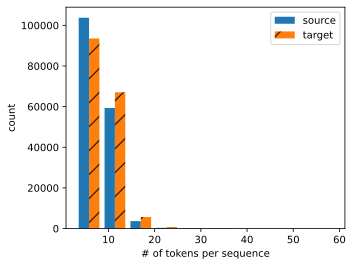

In [63]:
show_list_len_pair_hist(['source', 'target'], # legend
                        '# of tokens per sequence', # xlabel
                        'count', # ylabel
                        src, # xlist
                        tgt # ylist
                        )

Most of the text sequences have fewer than 20 tokens.

### 10.5.3. Loading Sequences of Fixed Length

In language modeling, each example sequence, either a segment of one sentence or a span over multiple sentences, had a fixed length, which was specified by the `num_steps` (number of time steps or tokens) argument.

In machine translation, each example is a pair of source and target text sequences, where the two text sequences may have different lengths.

Suppose that every sequence in the same minibatch should have the same length `num_steps`. If a text sequence has fewer than `num_steps` tokens, we will keep appending the special `"<pad>"` token to its end until its length reaches `num_steps`. Otherwise, will truncate the text sequence by only taking its first `num_steps` tokens and discarding the remaining. In this way, every text sequence will have the same length to be loaded in minibatches of the same shape. In addition, we also record length of the source sequence excluding padding tokens.

Since the machine translation dataset consists of pairs of languages, we can build two vocabularies for both the source language and the target language separately. With word-level tokenization, the vocabulary size will be significantly larger than that using character-level tokenization. To alleviate this, here we treat infrequent tokens that appear less than twice as the same unknown (`“<unk>”`) token.

When training with target sequences, the decoder output (label tokens) can be the same decoder input (target tokens), shifted by one token; and the special beginning-of-sequence `"<bos>"` token will be used as the first input token for predicting the target sequence.

In [64]:
@d2l.add_to_class(MTFraEng)
def __init__(self, batch_size, num_steps=9, num_train=512, num_val=128):
    super(MTFraEng, self).__init__()
    self.save_hyperparameters()

    self.arrays, self.src_vocab, self.tgt_vocab = self._build_arrays(self._download())

@d2l.add_to_class(MTFraEng)
def _build_arrays(self, raw_text, src_vocab=None, tgt_vocab=None):
    # break text into source and target
    def _build_array(sentences, vocab, is_tgt=False):
        pad_or_trim = lambda seq, t: (
            seq[:t] if len(seq) > t else seq + ['<pad>'] * (t - len(seq))
        )
        sentences = [pad_or_trim(s, self.num_steps) for s in sentences]

        if is_tgt:
            sentences = [['<bos>'] + s for s in sentences]
        
        if vocab is None:
            vocab = d2l.Vocab(sentences, min_freq=2)

        array = torch.tensor([vocab[s] for s in sentences])
        valid_len = (array != vocab['<pad>']).type(torch.int32).sum(1)

        return array, vocab, valid_len
    
    # tokenize raw text
    src, tgt = self._tokenize(
        self._preprocess(raw_text),
        self.num_train + self.num_val
    )
    # build source array
    src_array, src_vocab, src_valid_len = _build_array(src, src_vocab, False)
    # build target array
    tgt_array, tgt_vocab, tgt_valid_len = _build_array(tgt, tgt_vocab, True)

    return (
        (src_array, tgt_array[:, :-1], src_valid_len, tgt_array[:, 1:]),
        src_vocab,
        tgt_vocab
    )

### 10.5.4. Reading the Dataset

In [65]:
@d2l.add_to_class(MTFraEng)
def get_dataloader(self, train):
    idx = slice(0, self.num_train) if train else slice(self.num_train, None)
    return self.get_tensorloader(self.arrays, train, idx)

In [66]:
# read the first minibatch
data = MTFraEng(batch_size=3)
# get the first minibatch
src, tgt, src_valid_len, label = next(iter(data.train_dataloader()))

In [67]:
print('Source:', src.type(torch.int32))
print('Decoder Input:', tgt.type(torch.int32))
print('Source Length excluding padding:', src_valid_len.type(torch.int32))
print('Label:', label.type(torch.int32))

Source: tensor([[ 39, 122,   2,   3,   4,   4,   4,   4,   4],
        [171, 111,   2,   3,   4,   4,   4,   4,   4],
        [ 57, 105,   0,   3,   4,   4,   4,   4,   4]], dtype=torch.int32)
Decoder Input: tensor([[  3,   6,   0,   4,   5,   5,   5,   5,   5],
        [  3,  83,  52,   2,   4,   5,   5,   5,   5],
        [  3, 201,  24,   6,   0,   4,   5,   5,   5]], dtype=torch.int32)
Source Length excluding padding: tensor([4, 4, 4], dtype=torch.int32)
Label: tensor([[  6,   0,   4,   5,   5,   5,   5,   5,   5],
        [ 83,  52,   2,   4,   5,   5,   5,   5,   5],
        [201,  24,   6,   0,   4,   5,   5,   5,   5]], dtype=torch.int32)


In [68]:
# compare the source and target sequences in string format
@d2l.add_to_class(MTFraEng)
def build(self, src_sentences, tgt_sentences):
    raw_text = '\n'.join(
        [src + '\t' + tgt for src, tgt in zip(
            src_sentences, tgt_sentences
        )]
    )

    arrays, _, _ = self._build_arrays(
        raw_text, self.src_vocab, self.tgt_vocab
    )

    return arrays

In [69]:
src, tgt, _, _ = data.build(['hi .'], ['salut .'])
print('Source:', data.src_vocab.to_tokens(src[0].type(torch.int32)))
print('Target:', data.tgt_vocab.to_tokens(tgt[0].type(torch.int32)))

Source: ['hi', '.', '<eos>', '<pad>', '<pad>', '<pad>', '<pad>', '<pad>', '<pad>']
Target: ['<bos>', 'salut', '.', '<eos>', '<pad>', '<pad>', '<pad>', '<pad>', '<pad>']


In [70]:
# The complete implementation of the MTFraEng class
class MTFraEng(d2l.DataModule):
    '''French-English translation dataset'''
    def __init__(self, batch_size, num_steps=9, num_train=512, num_val=128):
        super(MTFraEng, self).__init__()
        self.save_hyperparameters()

        self.arrays, self.src_vocab, self.tgt_vocab = self._build_arrays(self._download())

    def _download(self):
        d2l.extract(d2l.download(
            d2l.DATA_URL + 'fra-eng.zip', self.root, '94646ad1522d915e7b0f9296181140edcf86a4f5'
        ))
        with open(self.root + '/fra-eng/fra.txt', encoding='utf-8') as f:
            return f.read()
        
    def _preprocess(self, text):
        # replace non-breaking space with space
        text = text.replace('\u202f', ' ').replace('\xa0', ' ')
        # insert space between words and punctuation marks
        no_space = lambda char, prev_char: char in ',.!?' and prev_char != ' '
        # prepare output
        out = [
            ' ' + char if i>0 and no_space(char, text[i-1]) else char
            for i, char in enumerate(text.lower())
        ]

        return ''.join(out)
    
    def _tokenize(self, text, max_examples=None):
        src, tgt = [], []

        for i, line in enumerate(text.split('\n')):
            # in each line
            
            if max_examples and i > max_examples:
                # stop if we have enough examples
                break
            
            parts = line.split('\t')
            if len(parts) == 2:
                # skip empty tokens
                src.append(
                    [t for t in f"{parts[0]} <eos>".split(' ') if t]
                )
                tgt.append(
                    [t for t in f"{parts[1]} <eos>".split(' ') if t]
                )

        return src, tgt
    
    def _build_arrays(self, raw_text, src_vocab=None, tgt_vocab=None):
        # break text into source and target
        def _build_array(sentences, vocab, is_tgt=False):
            pad_or_trim = lambda seq, t: (
                seq[:t] if len(seq) > t else seq + ['<pad>'] * (t - len(seq))
            )
            sentences = [pad_or_trim(s, self.num_steps) for s in sentences]

            if is_tgt:
                sentences = [['<bos>'] + s for s in sentences]
            
            if vocab is None:
                vocab = d2l.Vocab(sentences, min_freq=2)

            array = torch.tensor([vocab[s] for s in sentences])
            valid_len = (array != vocab['<pad>']).type(torch.int32).sum(1)

            return array, vocab, valid_len
        
        # tokenize raw text
        src, tgt = self._tokenize(
            self._preprocess(raw_text),
            self.num_train + self.num_val
        )
        # build source array
        src_array, src_vocab, src_valid_len = _build_array(src, src_vocab, False)
        # build target array
        tgt_array, tgt_vocab, tgt_valid_len = _build_array(tgt, tgt_vocab, True)

        return (
            (src_array, tgt_array[:, :-1], src_valid_len, tgt_array[:, 1:]),
            src_vocab,
            tgt_vocab
        )
    
    def get_dataloader(self, train):
        idx = slice(0, self.num_train) if train else slice(self.num_train, None)
        return self.get_tensorloader(self.arrays, train, idx)
    
    def build(self, src_sentences, tgt_sentences):
        raw_text = '\n'.join(
            [src + '\t' + tgt for src, tgt in zip(
                src_sentences, tgt_sentences
            )]
        )

        arrays, _, _ = self._build_arrays(
            raw_text, self.src_vocab, self.tgt_vocab
        )

        return arrays

## 10.6. The Encoder-Decoder Architecture

In general sequence-to-sequence problems, inputs and outputs are of varying lengths that are unaligned. The standard approach to handling this sort of data is to design an *encoder-decoder* architecture, as shown in the figure below, consisting of two major components: an *encoder* that takes a variable-length sequence as input and a *decoder* that acts as a conditional language model, taking in the encoded input and the leftwards conext of the target sequence and predicting the subsequent token in the target sequence.

![](../imgs/ch10/encoder-decoder.svg)

In [71]:
from torch import nn

from d2l import torch as d2l

### 10.6.1. Encoder

In the encoder interface, we specify that the encoder takes variable-length sequences as input `X`.

In [72]:
class Encoder(nn.Module):
    '''The base encoder interface for the encoder-decoder architecture'''
    def __init__(self):
        super().__init__()

    # later there can be additional arguments (e.g., length excluding padding)
    def forward(self, X, *args):
        raise NotImplementedError

### 10.6.2. Decoder

In the decoder interface, we add an additional `init_state` method to convert the encoder output (`enc_all_outputs`) into the encoded state. This step may require extra inputs, such as the valid length of the input. To generate a variable-length sequence token by token, every time the decoder may map an input (e.g., the generated token at the previous time step) and the encoded state into an output token at the current time step.

In [73]:
class Decoder(nn.Module):
    '''The base decoder interface for the encoder-decoder architecture'''
    def __init__(self):
        super().__init__()

    # later there can be additional arguments (e.g., length excluding padding)
    def init_state(self, enc_all_outputs, *args):
        raise NotImplementedError
    
    def forward(self, X, state):
        raise NotImplementedError

### 10.6.3. Putting the Encoder and Decoder Together

In the forward propagation, the output of the encoder is used to produce the encoded state, and this state will be further used by the decoder as one of its input.

In [74]:
class EncoderDecoder(d2l.Classifier):
    '''The base class for the encoder-decoder architecture'''
    def __init__(self, encoder, decoder):
        super().__init__()
        
        self.encoder = encoder
        self.decoder = decoder

    def forward(self, enc_X, dec_X, *args):
        enc_all_outputs = self.encoder(enc_X, *args)
        dec_state = self.decoder.init_state(enc_all_outputs, *args)

        # return the decoder output only
        res = self.decoder(dec_X, dec_state)[0]
        return res

## 10.7. Sequence-to-Sequence Learning for Machine Translation

In sequence-to-sequence problems, where inputs and outputs each consist of variable-length unaligned sequences, we generally rely on encoder-decoder architectures.

The encoder RNN will take a variable-length sequence as input and transform it into a fixed-shape hidden state. To generate the output sequence, one token at a time, the decoder model, consisting of a separate RNN, will predict each successive target token given both the input sequence and the preceding tokens in the output.

During training, the decoder will typically be conditioned upon the preceding tokens in the "ground truth" label. At test time, we want to condition each output of the decoder on the tokens already predicted.

If we ignore the encoder, the decoder in a sequence-to-sequence architecture behaves just like a normal language model. The figure below shows how to use two RNNs for sequence-to-sequence learning in machine translation.

![](../imgs/ch10/seq2seq.svg)

In the figure above, the special `"<eos>"` token marks the end of the sequence. The model can stop making predictions once this token is generated. 

At the initial time step of the RNN decoder,
1. we begin every input with a special beginning-of-sequence `"<bos>"` token, and
2. we may feed the final hidden state of the encoder into the decoder at every single decoding time step.

In [1]:
import collections
import math
import torch
from torch import nn
from torch.nn import functional as F

from d2l import torch as d2l

### 10.7.1. Teacher Forcing

While running the encoder on the input sequence is relatively straightforward, handling the input and output of the decoder requries more care. The most common approach is called *teacher forcing*.

In teacher forcing, the original target sequence (token labels) is fed into the decoder as input. The special beginning-of-sequence `"<bos>"` token and the original target sequence, excluding the final token, are concatenated as input to the decoder, while the decoder output (labels for training) is the original target sequence, shifted by one token: `"<bos>", "lls", "regardent", "."` $\rightarrow$ `"lls", "regardent", ".", "<eos>"`.

The dataset class `MTFraEng` in Section 10.5 prepared training data for teacher foring, where shifting tokens for self-supervised learning is similar to the training of language models. An alternative approach is to feed the *predicted* token from the previous time step as the current input to the decoder.

### 10.7.2. Encoder

*The encoder transforms an input sequence of variable length into a fixed-shape **context variable*** $\mathbf{c}$.

Consider a single sequence example (batch size 1). Suppose the input sequence is $x_1, \ldots, x_T$, such that $x_t$ is the $t$-th token. At time step $t$, the RNN transforms the input feature vector $\mathbf{x}_t$ for $x_t$ and the hidden state $\mathbf{h}_{t-1}$ from the previous time step into the current hidden state $\mathbf{h}_t$, via the recurrent layer:
\begin{split}
\mathbf{h}_t = f(\mathbf{x}_t, \mathbf{h}_{t-1})
\end{split}

In general, the encoder transforms the hidden states at all time steps into a context variable through a customized function $q$:
\begin{split}
\mathbf{c} =  q(\mathbf{h}_1, \ldots, \mathbf{h}_T)
\end{split}

![](../imgs/ch10/seq2seq.svg)

For example, in the figure above, the context variable is the hidden state $\mathbf{h}_T$ corresponding to the encoder RNN's representation after processing the final token of the input sequence.

Here, we have used a unidirectional RNN to design the encoder, where the hidden state only depends on the input subsequence at and before the time step of the hidden state.

To implement the RNN encoder, we need to use an *embedding layer* to obtain the feature vector for each token in the input sequence. 

The weight of an embedding layer is a matrix, where the number of rows corresponds to the size of the input vocabulary (`vocab_size`) and the number of columns corresponds to the feature vector's dimension (`embed_size`). For any input token index $i$, the embedding layer fetches the $i$-th row (starting from 0) of the weight matrix to return its feature vector.

In [2]:
def init_seq2seq(module):
    '''Initialize weights for seq2seq learning'''
    if type(module) == nn.Linear:
        nn.init.xavier_uniform_(module.weight)

    if type(module) == nn.GRU:
        for param in module._flat_weights_names:
            if "weight" in param:
                nn.init.xavier_uniform_(module._parameters[param])

In [3]:
class Seq2SeqEncoder(d2l.Encoder):
    '''The RNN encoder for seq2seq learning'''
    def __init__(self, vocab_size, embed_size, num_hiddens, num_layers, dropout=0):
        super().__init__()

        # embedding layer
        self.embedding = nn.Embedding(vocab_size, embed_size)
        # GRU layer
        self.rnn = d2l.GRU(embed_size, num_hiddens, num_layers, dropout)
        # initialize weights
        self.apply(init_seq2seq)

    def forward(self, X, *args):
        # X shape: (batch_size, num_steps)
        embs = self.embedding(X.t().type(torch.int64))
        # embs shape: (num_steps, batch_size, embed_size)
        outputs, state = self.rnn(embs)
        # outputs shape: (num_steps, batch_size, num_hiddens)
        # state shape:  (num_layers, batch_size, num_hiddens)
        return outputs, state

We instantiate a two-layer GRU encoder whose number of hidden units is 16. Given a minibatch of sequence inputs `X` (batch size =4; number of time steps = 9), the hidden states of the final layer at all the time steps (`enc_outputs` returned by the encoder's recurrent layers) are a tensor of shape (number of time steps, batch size, number of hidden units). 

In [4]:
# vocabuary size
vocab_size = 10
# embedding size
embed_size = 8
# number of hidden units
num_hiddens = 16
# number of layers
num_layers = 2
# batch size
batch_size = 4
# number of time steps
num_steps = 9

# create a minibatch of inputs
X = torch.zeros((batch_size, num_steps))

In [5]:
# create an encoder
encoder = Seq2SeqEncoder(vocab_size, embed_size, num_hiddens, num_layers)
# pass the inputs through the encoder
enc_outputs, enc_state = encoder(X)
# check the output shape
d2l.check_shape(enc_outputs, (num_steps, batch_size, num_hiddens))
enc_outputs.shape

torch.Size([9, 4, 16])

Since we use a GRU, the shape of the multilayer hidden states at the final time step is (number of hidden layers, batch size, number of hidden units).

In [6]:
d2l.check_shape(enc_state, (num_layers, batch_size, num_hiddens))
enc_state.shape

torch.Size([2, 4, 16])

### 10.7.3. Decoder

Given a target output sequence $y_1, y_2, \ldots, y_{T'}$ for each time step $t'$ ($t'$ is used to differentiate from the time step $t$ in the input sequence time steps), the decoder assigns a predicted probability to each possible token occurring at step $y_{t'+1}$ conditioned upon the previous tokens in the target $y_1, \ldots, y_{t'}$ and the context variable $\mathbf{c}$, i.e., $P(y_{t'+1} \mid y_1, \ldots, y_{t'}, \mathbf{c})$.

To predict the subsequent token $t'+1$ in the target sequence, the RNN decoder takes the previous step's target token $y_{t'}$, the hidden RNN state from the previous time step $\mathbf{s}_{t'-1}$, and the context variable $\mathbf{c}$ as its input, and then transforms them into the hiddeen state $\mathbf{s}_{t'}$ at the current time step. We can use a function $g$ to express the transformation of the decoder's hidden layer:
\begin{split}
\mathbf{s}_{t^\prime} = g(y_{t^\prime-1}, \mathbf{c}, \mathbf{s}_{t^\prime-1})
\end{split}

After obtaining the hidden state of the decoder, we can use an output layer and the softmax operation to compute the predictive distribution $p(y_{t'+1} \mid y_1, \ldots, y_{t'}, \mathbf{c})$ over the subsequent output token $t'+1$.

![](../imgs/ch10/seq2seq.svg)

We follow the flow in the figure above when implementing the decoder. We directly use the hidden state at the final time step of the encoder to initialize the hidden state of the decoder. This requires that the RNN encoder and the RNN decoder have the same number of layers and hidden units. The context variable is also concatenated with the decoder input at all the time steps. To predict the probability distribution of the output token, we use a fully connected layer to transform the hidden state at the final layer of the RNN decoder.

In [7]:
class Seq2SeqDecoder(d2l.Decoder):
    '''The RNN decoder for seq2seq learning'''
    def __init__(self, vocab_size, embed_size, num_hiddens, num_layers, dropout=0):
        super().__init__()

        self.embedding = nn.Embedding(vocab_size, embed_size)
        self.rnn = d2l.GRU(embed_size + num_hiddens,
                           num_hiddens,
                           num_layers,
                           dropout)
        self.dense = nn.LazyLinear(vocab_size)

        # initialize weights
        self.apply(init_seq2seq)

    def init_state(self, enc_all_outputs, *args):
        return enc_all_outputs
    
    def forward(self, X, state):
        # X shape: (batch_size, num_steps)
        # embs shape: (num_steps, batch_size, embed_size)
        embs = self.embedding(X.t().type(torch.int32))
        enc_output, hidden_state = state

        # context shape: (batch_size, num_hiddens)
        context = enc_output[-1]

        # broadcast context to (num_steps, batch_size, num_hiddens)
        context = context.repeat(embs.shape[0], 1, 1)

        # concatenate at the feature dimension
        embs_and_context = torch.cat((embs, context), dim=-1)

        outputs, hidden_state = self.rnn(embs_and_context, hidden_state)
        outputs = self.dense(outputs).swapaxes(0, 1)
        # outputs shape: (batch_size, num_steps, vocab_size)
        # hidden_state shape: (num_layers, batch_size, num_hiddens)

        return outputs, [enc_output, hidden_state]

In [9]:
# instantiate the decoder with the same hyperparameters as the encoder
decoder = Seq2SeqDecoder(vocab_size, embed_size, num_hiddens, num_layers)
# initialize the decoder state
state = decoder.init_state(encoder(X))
# pass the inputs and decoder state through the decoder
dec_outputs, state = decoder(X, state)

# check the output shape
d2l.check_shape(dec_outputs, (batch_size, num_steps, vocab_size))
dec_outputs.shape

torch.Size([4, 9, 10])

In [10]:
# check the decoder state shape
d2l.check_shape(state[1], (num_layers, batch_size, num_hiddens))
state[1].shape

torch.Size([2, 4, 16])

The layers in the above RNN encoder-decoder model are summarized in the figure below.

![](../imgs/ch10/seq2seq-details.svg)

### 10.7.4. Encoder-Decoder for Sequence-to-Sequence Learning

In [12]:
class Seq2Seq(d2l.EncoderDecoder):
    '''The RNN encoder-decoder for seq2seq learning'''
    def __init__(self, encoder, decoder, tgt_pad, lr):
        super().__init__(encoder, decoder)
        self.save_hyperparameters()

    def validation_step(self, batch):
        Y_hat = self(*batch[:-1])
        self.plot('loss', self.loss(Y_hat, batch[-1]), train=False)

    def configure_optimizers(self):
        # Adam optimizer is used
        return torch.optim.Adam(self.parameters(), lr=self.lr)

### 10.7.5. Loss Function with Masking

At each time step, the decoder predicts a probability distribution for the output tokens. As with language modeling, we can apply softmax to obtain the distribution and calculate the cross-entropy loss for optimization.

The special padding tokens are appended to the end of sequences and so sequences of varying lengths can be efficiently loaded in minibatches of the same shape. However, prediction of padding tokens should be excluded from loss calculations. We can mask irrelevant entries with zero values so that multiplication of any irrelevant prediction with zero equates to zero.

In [14]:
@d2l.add_to_class(Seq2Seq)
def loss(self, Y_hat, Y):
    # cross-entropy loss
    l = super(Seq2Seq, self).loss(Y_hat, Y, averaged=False)
    # mask padding tokens
    mask = (Y.reshape(-1) != self.tgt_pad).type(torch.float32)

    loss = (l * mask).sum() / mask.sum()

    return loss

In [ ]:
# The complete implementation of the Seq2Seq, Seq2SeqEncoder, and Seq2SeqDecoder classes
def init_seq2seq(module):
    '''Initialize weights for seq2seq learning'''
    if type(module) == nn.Linear:
        nn.init.xavier_uniform_(module.weight)

    if type(module) == nn.GRU:
        for param in module._flat_weights_names:
            if "weight" in param:
                nn.init.xavier_uniform_(module._parameters[param])

class Seq2SeqEncoder(d2l.Encoder):
    '''The RNN encoder for seq2seq learning'''
    def __init__(self, vocab_size, embed_size, num_hiddens, num_layers, dropout=0):
        super().__init__()

        # embedding layer
        self.embedding = nn.Embedding(vocab_size, embed_size)
        # GRU layer
        self.rnn = d2l.GRU(embed_size, num_hiddens, num_layers, dropout)
        # initialize weights
        self.apply(init_seq2seq)

    def forward(self, X, *args):
        # X shape: (batch_size, num_steps)
        embs = self.embedding(X.t().type(torch.int64))
        # embs shape: (num_steps, batch_size, embed_size)
        outputs, state = self.rnn(embs)
        # outputs shape: (num_steps, batch_size, num_hiddens)
        # state shape:  (num_layers, batch_size, num_hiddens)
        return outputs, state
    

class Seq2SeqDecoder(d2l.Decoder):
    '''The RNN decoder for seq2seq learning'''
    def __init__(self, vocab_size, embed_size, num_hiddens, num_layers, dropout=0):
        super().__init__()

        self.embedding = nn.Embedding(vocab_size, embed_size)
        self.rnn = d2l.GRU(embed_size + num_hiddens,
                           num_hiddens,
                           num_layers,
                           dropout)
        self.dense = nn.LazyLinear(vocab_size)

        # initialize weights
        self.apply(init_seq2seq)

    def init_state(self, enc_all_outputs, *args):
        return enc_all_outputs
    
    def forward(self, X, state):
        # X shape: (batch_size, num_steps)
        # embs shape: (num_steps, batch_size, embed_size)
        embs = self.embedding(X.t().type(torch.int32))
        enc_output, hidden_state = state

        # context shape: (batch_size, num_hiddens)
        context = enc_output[-1]

        # broadcast context to (num_steps, batch_size, num_hiddens)
        context = context.repeat(embs.shape[0], 1, 1)

        # concatenate at the feature dimension
        embs_and_context = torch.cat((embs, context), dim=-1)

        outputs, hidden_state = self.rnn(embs_and_context, hidden_state)
        outputs = self.dense(outputs).swapaxes(0, 1)
        # outputs shape: (batch_size, num_steps, vocab_size)
        # hidden_state shape: (num_layers, batch_size, num_hiddens)

        return outputs, [enc_output, hidden_state]
    

class Seq2Seq(d2l.EncoderDecoder):
    '''The RNN encoder-decoder for seq2seq learning'''
    def __init__(self, encoder, decoder, tgt_pad, lr):
        super().__init__(encoder, decoder)
        self.save_hyperparameters()

    def validation_step(self, batch):
        Y_hat = self(*batch[:-1])
        self.plot('loss', self.loss(Y_hat, batch[-1]), train=False)

    def configure_optimizers(self):
        # Adam optimizer is used
        return torch.optim.Adam(self.parameters(), lr=self.lr)
    
    def loss(self, Y_hat, Y):
        # cross-entropy loss
        l = super(Seq2Seq, self).loss(Y_hat, Y, averaged=False)
        # mask padding tokens
        mask = (Y.reshape(-1) != self.tgt_pad).type(torch.float32)

        loss = (l * mask).sum() / mask.sum()

        return loss

### 10.7.6. Training

In [18]:
# load the French-English translation dataset
data = d2l.MTFraEng(batch_size=128, num_steps=10)

# hyperparameters
embed_size = 256
num_hiddens = 256
num_layers = 2
dropout = 0.2

# instantiate the encoder
encoder = Seq2SeqEncoder(
    vocab_size=len(data.src_vocab), # vocabulary size
    embed_size=embed_size, # embedding size
    num_hiddens=num_hiddens, # number of hidden units
    num_layers=num_layers, # number of layers
    dropout=dropout # dropout rate
)

# instantiate the decoder
decoder = Seq2SeqDecoder(
    vocab_size=len(data.tgt_vocab), # vocabulary size
    embed_size=embed_size, # embedding size
    num_hiddens=num_hiddens, # number of hidden units
    num_layers=num_layers, # number of layers
    dropout=dropout # dropout rate
)

# instantiate the model
model = Seq2Seq(
    encoder=encoder, # encoder
    decoder=decoder, # decoder
    tgt_pad=data.tgt_vocab['<pad>'], # padding token
    lr=0.005 # learning rate
)

# create a trainer
trainer = d2l.Trainer(max_epochs=100, gradient_clip_val=1, num_gpus=1)

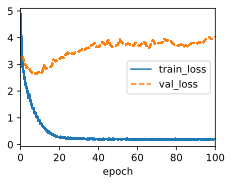

In [19]:
# train the model
trainer.fit(model, data)

### 10.7.7. Prediction

To predict the output sequence at each step, the predicted token from the previous time step is fed into the decoder as an input. One simple strategy is to sample whichever token that has been assigned by the decoder the highest probability when predicting at each step.

As in training, at the initial time step the beginning-of-sequence (“<bos>”) token is fed into the decoder. The figure below shows the prediction process of the RNN encoder-decoder model. When the end-of-sequence (“<eos>”) token is predicted, the output sequence generation is complete.

![](../imgs/ch10/seq2seq-predict.svg)

In [20]:
@d2l.add_to_class(d2l.EncoderDecoder)
def predict_step(self, batch, device, num_steps, save_attention_weights=False):
    # get the source and target sequences
    batch = [a.to(device) for a in batch]
    src, tgt, src_valid_len, _ = batch

    # feed the source sequence through the encoder
    enc_all_outputs = self.encoder(src, src_valid_len)
    # initialize the decoder state
    dec_state = self.decoder.init_state(enc_all_outputs, src_valid_len)
    # initialize the attention weights
    outputs, attention_weights = [tgt[:, (0)].unsqueeze(1),], []

    # feed the target sequence through the decoder
    for _ in range(num_steps):
        Y, dec_state = self.decoder(outputs[-1], dec_state)
        outputs.append(Y.argmax(dim=2))
        # save the attention weights
        if save_attention_weights:
            attention_weights.append(self.decoder.attention_weights)

    return torch.cat(outputs[1:], 1), attention_weights

### 10.7.8. Evaluation of Predicted Sequences

We can evaluate a predicted sequence by comparing it with the target sequence (the ground truth).

For any $n$-gram in the predicted sequence, the *Bilingual Evaluation Understudy* (BLUE) evaluates whether this $n$-gram appears in the target sequence.

Denote by $p_n$ the precision of an $n$-gram, defined as the ratio of the number of matched $n$-grams in the predited and target sequences to the number of $n$-grams in the predicted sequence. For example, given a target sequence $A,B,C,D,E,F$, and a predicted sequence $A,B,B,C,D$, then we have $p_1 = 4/5$ for unigrams, $p_2 = 3/4$ for bigrams, $p_3 = 1/3$ for trigrams, and $p_4 = 0$ for 4-grams. 

Let $\textrm{len}_{\textrm{label}}$ and $\textrm{len}_{\textrm{pred}}$ be the numbers of tokens in the target sequence and the predicted sequence, respectively. Then, BLUE is defined as
\begin{split}
\textrm{BLEU}=\exp\left(\min\left(0, 1 - \frac{\textrm{len}_{\textrm{label}}}{\textrm{len}_{\textrm{pred}}}\right)\right) \prod_{n=1}^k p_n^{1/2^n},
\end{split}
where $k$ is the longest $n$-gram for matching.

The value of BLEU is between 0 and 1. whenever the predicted sequence is the same as the target sequence, BLEU is 1. Since matching longer $n$-grams is more difficult, BLEU assigns a greater weight when a longer $n$-gram has high precision. Specifically, when $p_n$ is fixed, $p_n^{1/2^n}$ increases as $n$ grows (the original paper uses $p_n^{1/n}$).

Since predicting shorter sequences tends to yield a higher $p_n$ value, the coefficient before the product of $p_n$'s in the formula for BLEU penalizes shorter predicted sequences. For example, when $k=2$, given the target sequence $A,B,C,D,E,F$, and the predicted sequence $A,B$, although $p_1=p_2=1$, the penalty factor $\exp(1-6/2) \approx 0.14$ results in a BLEU score of approximately 0.48.

We can implement the BLEU measure:

In [21]:
def bleu(pred_seq, label_seq, k):
    '''Compute the BLEU'''
    # split the sequences into tokens
    pred_tokens = pred_seq.split(' ')
    label_tokens = label_seq.split(' ')
    
    len_pred, len_label = len(pred_tokens), len(label_tokens)
    # first compute the exponential of the min of 0 and 1 - len_label / len_pred
    score = math.exp(min(0, 1 - len_label / len_pred))

    # compute the n-gram matches
    for n in range(1, min(k, len_pred) + 1):
        num_matches, label_subs = 0, collections.defaultdict(int)

        for i in range(len_label - n + 1):
            label_subs[' '.join(label_tokens[i:i+n])] += 1

        for i in range(len_pred - n + 1):
            if label_subs[' '.join(pred_tokens[i:i+n])] > 0:
                num_matches += 1
                label_subs[' '.join(pred_tokens[i:i+n])] -= 1

        score *= math.pow(num_matches / (len_pred - n + 1), math.pow(0.5, n) )

    return score

We can use the trained RNN encoder–decoder to translate a few English sentences into French and compute the BLEU of the results:

In [22]:
# Example
engs = ['go .', 'i lost .', 'he\'s calm .', 'i\'m home .']
fras = ['va !', 'j\'ai perdu .', 'il est calme .', 'je suis chez moi .']

In [25]:
preds, _ = model.predict_step(
    data.build(engs, fras), # minibatch
    d2l.try_gpu(), # device
    data.num_steps, # number of time steps
)

for en, fr, p in zip(engs, fras, preds):
    translation = []

    for token in data.tgt_vocab.to_tokens(p):
        if token == '<eos>':
            break

        translation.append(token)

    print(f"{en} => {translation} | bleu = "
          f"{bleu(' '.join(translation), fr, k=2):.3f}")

go . => ['va', '!'] | bleu = 1.000
i lost . => ["j'ai", 'perdu', '.'] | bleu = 1.000
he's calm . => ['sois', 'calme', '.'] | bleu = 0.492
i'm home . => ['je', 'suis', 'chez', 'moi', '.'] | bleu = 1.000


## 10.8. Beam Search

In the encoder-decoder architecture, when it comes to test-time prediction, our strategy is *greedy* that we select at each time step the token given the highest predicted probability of coming next, until, at some time step, we find that we have predicted the special end-of-sequence `"<eos>"` token.

Mathematically, at any time step $t'$, the decoder output predictions representing the probability of each token in the vocabulary coming next in the sequence (the likely value of $y_{t'+1}$), conditioned on the previous tokens $y_1, \ldots, y_{t'}$ and the context variable $\mathbf{c}$, produced by the encoder to represent the input sequence.

To quantify computational cost, denote by $|\mathcal{Y}|$ the output vocabulary (including the special end-of-sequence token `"<eos>"`). The maximum number of tokens of an output sequence is denoted as $T'$. Our goal is to search for an ideal output from all $\mathcal{O}(\left|\mathcal{Y}\right|^{T'})$ possible output sequences.

Note that this slightly overestimates the number of distinct outputs because there are no subsequent tokens once the `"<eos>"` token occurs, but for our purposes, this number roughly captures the size of the search space.

### 10.8.1. Greedy Search

Consider the simple *greedy search* strategy. At any time step $t'$, we simply select the token with the highest conditional probability from $\mathcal{Y}$, i.e.,
\begin{split}
y_{t'} = \operatorname*{argmax}_{y \in \mathcal{Y}} P(y \mid y_1, \ldots, y_{t'-1}, \mathbf{c})
\end{split}

Once our model outputs `"<eos>"` (or we reach the maximum length $T'$), the output sequence is completed.

However, it may seem more reasonable to search for the *most likely sequence*, not the sequence of (greedily selected) *most likely tokens*.

The most likely sequence is the one that maximizes the expression
\begin{split}
\prod_{t'=1}^{T'} P(y_{t'} \mid y_1, \ldots, y_{t'-1}, \mathbf{c})
\end{split}

For example, suppose that there are four tokens "A", "B", "C", and `"<eos>"` in the output vocabulary. In the figure below, the four numbers under each time step represent the conditional probabilities of generating "A", "B", "C", and `"<eos>"`, respectively, at each time step.

![](../imgs/ch10/s2s-prob1.svg)

At each time step, greedy search selects the token with the highest conditional probability. Therefore, the output sequence "A", "B", "C", and `"<eos>"` will be predicted as the most likely sequence in the figure above. The conditional probability of this output sequence is $0.5 \times 0.4 \times 0.4 \times 0.6 = 0.048$.

![](../imgs/ch10/s2s-prob2.svg)

However, if we have another example shown in the figure above, at time step 2 we select the token "C", which has the *second* highest conditional probability. Then, since the output sequences at time steps 1 and 2 have changed from "A" and "B" to "A" and "C" this time, the conditional probability of each token at time step 3 has also changed in the figure above. Suppose that we choose the token "B" at time step 3. Then, time step 4 is conditional on the output subsequence at the first three time steps "A", "C", and "B", which has changed from "A", "B", and "C" in the first example. Therefore, the conditional probability of generating each token at time step 4 has also changed in the figure above. In this way, the conditional probability of the output sequence "A", "C", "B", and `"<eos>"` is $0.5 \times 0.3 \times 0.6 \times 0.6 = 0.054$, which is greater than that of greedy search in the first example.

### 10.8.2. Exhaustive Search

If the goal is to obtain the most likely sequence, the method of *exhaustive search* may be applied to find the sequence that maximizes the conditional probability. We can enumerate all the possible output sequences with their conditional probabilities, and then output the one that scores the highest predicted probability.

However, the computational cost of this method is $\mathcal{O}(\left|\mathcal{Y}\right|^{T'})$, exponential in the sequence length and with an enormous base given by the vocabulary size.

### 10.8.3. Beam Search

At time step 1, we select the $k$ tokens with the highest predicted probabilities. Each of them will be the first tokens of $k$ candidate output sequences, respectively. At each subsequent time step, based on the $k$ candidate output sequences at the previous time step, we continue to select $k$ candidate output sequences with the highest conditional probabilities from $k \left|\mathcal{Y}\right|$ possible choices.

![](../imgs/ch10/beam-search.svg)

The figure above demonstrates the process of *beam search*. Suppose that the output vocabulary contains only five elements:
\begin{split}
\mathcal{Y} = \{A, B, C, D, E\}
\end{split}
where one of them is `"<eos>"`.

Let the *beam size* $k$ be two and the maximum length of an output sequence be three (time steps). At time step 1, suppose that the tokens with the highest conditional probabilities $P(y_1 \mid \mathbf{c})$ are $A$ and $C$.

At time step 2, for all $y_2 \in \mathcal{Y}$, we compute
\begin{split}\begin{aligned}
P(A, y_2 \mid \mathbf{c}) = P(A \mid \mathbf{c})P(y_2 \mid A, \mathbf{c}),\\ P(C, y_2 \mid \mathbf{c}) = P(C \mid \mathbf{c})P(y_2 \mid C, \mathbf{c}),
\end{aligned}\end{split}
and pick the largest two among these ten values, assuming that they are $P(A, B \mid \mathbf{c})$ and $P(C, E \mid \mathbf{c})$.

Then at time step 3, for all $y_3 \in \mathcal{Y}$, we compute
\begin{split}\begin{aligned}
P(A, B, y_3 \mid \mathbf{c}) = P(A, B \mid \mathbf{c})P(y_3 \mid A, B, \mathbf{c}),\\P(C, E, y_3 \mid \mathbf{c}) = P(C, E \mid \mathbf{c})P(y_3 \mid C, E, \mathbf{c}),
\end{aligned}\end{split}
and pick the largest two among these ten values, assuming that they are $P(A, B, D \mid \mathbf{c})$ and $P(C, E, D \mid \mathbf{c})$.

As a result, we get 6 candidate output sequences:
1. $A$;
2. $C$;
3. $A,B$;
4. $C,E$;
5. $A,B,D$;
6. $C,E,D$.

Finally, we obtain the set of final candidate output sequences based on these 6 sequences (e.g., discard portions including and after `"<eos>"`). Then we choose the output sequence which maximizes the following score:
\begin{split}
\textrm{score}_{\textrm{Beam Search}}=\frac{1}{L^\alpha} \log P(y_1, \ldots, y_{L}\mid \mathbf{c}) = \frac{1}{L^\alpha} \sum_{t'=1}^L \log P(y_{t'} \mid y_1, \ldots, y_{t'-1}, \mathbf{c})
\end{split}
where $L$ is the length of the final candidate sequence and $\alpha$ is usually set to 0.75. Since a longer sequence has more logarithmic terms in the summation in the score, the term $L^\alpha$ in the denominator penalizes long sequences.

The computational cost of beam search is $\mathcal{O}(k \left|\mathcal{Y}\right|T')$. This result is in between that of greedy search and that of exhaustive search. Greedy search can be treated as a special case of beam search arising when the beam size is set to 1.